In [ ]:
from transformers import pipeline
import torch

pipe = pipeline(
    "image-text-to-text",
    model="google/medgemma-1.5-4b-it",
    torch_dtype=torch.bfloat16,
    device="cuda"
)

[transformers] `torch_dtype` is deprecated! Use `dtype` instead!


Loading weights:   0%|          | 0/883 [00:00<?, ?it/s]

In [ ]:
print("hello")

In [ ]:
from model.model import model
from utils.utils import run_medgemma

Loading weights:   0%|          | 0/883 [00:00<?, ?it/s]

In [ ]:
import os
import glob
import pydicom

dicom_dir = "/home/nafisha/medGemma_service/GKPFX4824"

dicom_files = glob.glob(
    os.path.join(dicom_dir, "**", "*.dcm"),
    recursive=True
)

print(len(dicom_files))

slices = [pydicom.dcmread(f) for f in dicom_files]

if hasattr(slices[0], "ImagePositionPatient"):
    slices.sort(
        key=lambda s: float(s.ImagePositionPatient[2])
    )
elif hasattr(slices[0], "InstanceNumber"):
    slices.sort(
        key=lambda s: int(s.InstanceNumber)
    )

180


In [ ]:
import numpy as np

normalized_mri_slices = []

for ds in slices:
    img = ds.pixel_array.astype(np.float32)
    
    if img.max() > img.min():
        img = (img - img.min()) / (img.max() - img.min())
    else:
        img = np.zeros_like(img)

    img = (img * 255).astype(np.uint8)

    normalized_mri_slices.append(img)

print("Number of slices:", len(normalized_mri_slices))
print("First slice shape:", normalized_mri_slices[0].shape)

Number of slices: 180
First slice shape: (512, 512)


In [ ]:
MAX_SLICES = 80

if len(normalized_mri_slices) > MAX_SLICES:
    selected = []
    for i in range(MAX_SLICES):
        idx = int(
            round(
                i * (len(normalized_mri_slices) - 1)
                / (MAX_SLICES - 1)
            )
        )
        selected.append(normalized_mri_slices[idx])
    normalized_mri_slices = selected

print("Slices used:", len(normalized_mri_slices))

Slices used: 80


In [ ]:
len(normalized_mri_slices)

80

In [ ]:
import io
import base64

def encode_slice(data):
    with io.BytesIO() as buffer:
        Image.fromarray(data).save(
            buffer,
            format="JPEG"
        )
        encoded = base64.b64encode(
            buffer.getvalue()
        ).decode("utf-8")

    return f"data:image/jpeg;base64,{encoded}"

In [ ]:
from PIL import Image

# Convert to PIL Images

mri_slice_images = [
    Image.fromarray(img)
    for img in normalized_mri_slices
]

print(f"Created {len(mri_slice_images)} PIL images")

Created 80 PIL images


In [ ]:
instruction = """
You are an expert neuroradiologist.

You are analyzing a contiguous MRI volume represented as sequential slices.

Review all slices carefully.

Determine:

1. Whether the study is NORMAL or ABNORMAL.
2. If abnormal, describe the primary abnormality.
3. Explain the imaging evidence supporting your conclusion.

Respond in JSON:

{
    "classification": "NORMAL or ABNORMAL",
    "abnormality": "...",
    "reasoning": "..."
}
"""

query_text = "Based on all slices, determine whether this MRI is normal or abnormal."

content = []
content.append({"type": "text", "text": instruction})
for slice_idx, slice_img in enumerate(normalized_mri_slices, start=1):
    # print(slice_idx)
    content.append({"type": "image", "image": encode_slice(slice_img)})
    content.append({"type": "text", "text": f"SLICE {slice_idx}"})
content.append({"type": "text", "text": query_text})

messages = [
    {
        "role": "user",
        "content": content
    }
]

In [ ]:
# Run medgemma

output = pipe(
    text=messages,
    max_new_tokens=2000
)

[transformers] Deprecated: `processor.image_token` will switch from returning `tokenizer.image_token` to `tokenizer.boi_token` in v5.11.
[transformers] Passing `generation_config` together with generation-related arguments=({'max_new_tokens'}) is deprecated and will be removed in future versions. Please pass either a `generation_config` object OR all generation parameters explicitly, but not both.
[transformers] Setting `pad_token_id` to `eos_token_id`:1 for open-end generation.
[transformers] Both `max_new_tokens` (=2000) and `max_length`(=20) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


OutOfMemoryError: CUDA out of memory. Tried to allocate 2.63 GiB. GPU 0 has a total capacity of 23.51 GiB of which 1.14 GiB is free. Including non-PyTorch memory, this process has 21.84 GiB memory in use. Of the allocated memory 21.25 GiB is allocated by PyTorch, and 136.82 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://docs.pytorch.org/docs/stable/notes/cuda.html#optimizing-memory-usage-with-pytorch-cuda-alloc-conf)

## examining prompt

In [ ]:
import json

from IPython.display import display, Markdown


def truncate_prompt(obj, max_len):
  # Clip strings in prompt to avoid displaying excessively large content in Colab notebook.
  if isinstance(obj, dict):
    return {k: truncate_prompt(v, max_len) for k, v in obj.items()}
  elif isinstance(obj, list):
    return [truncate_prompt(elem, max_len) for elem in obj]
  elif isinstance(obj, str) and len(obj) > max_len:
    return obj[:max_len] + "..."  # Add ellipsis for truncated strings
  return obj


txt = json.dumps(truncate_prompt(messages, 100), indent=4, sort_keys=True)
display(Markdown(f"```json\n{txt}"))

```json
[
    {
        "content": [
            {
                "text": "\nYou are an expert neuroradiologist.\n\nYou are analyzing a contiguous MRI volume represented as seque...",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 1",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 2",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 3",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 4",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 5",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 6",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 7",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 8",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 9",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 10",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 11",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 12",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 13",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 14",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 15",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 16",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 17",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 18",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 19",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 20",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 21",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 22",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 23",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 24",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 25",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 26",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 27",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 28",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 29",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 30",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 31",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 32",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 33",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 34",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 35",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 36",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 37",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 38",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 39",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 40",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 41",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 42",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 43",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 44",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 45",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 46",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 47",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 48",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 49",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 50",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 51",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 52",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 53",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 54",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 55",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 56",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 57",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 58",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 59",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 60",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 61",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 62",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 63",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 64",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 65",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 66",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 67",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 68",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 69",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 70",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 71",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 72",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 73",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 74",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 75",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 76",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 77",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 78",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 79",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 80",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 81",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 82",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 83",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 84",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 85",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 86",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 87",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 88",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 89",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 90",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 91",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 92",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 93",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 94",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 95",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 96",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 97",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 98",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 99",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 100",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 101",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 102",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 103",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 104",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 105",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 106",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 107",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 108",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 109",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 110",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 111",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 112",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 113",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 114",
                "type": "text"
            },
            {
                "image": "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aH...",
                "type": "image"
            },
            {
                "text": "SLICE 115",
                "type": "text"
            },
            {
                "text": "Based on all slices, determine whether this MRI is normal or abnormal.",
                "type": "text"
            }
        ],
        "role": "user"
    }
]

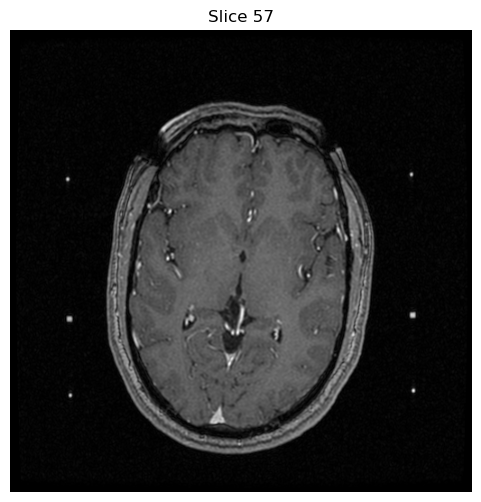

In [ ]:
import matplotlib.pyplot as plt

# visualize single image

mid = len(normalized_mri_slices) // 2

plt.figure(figsize=(6, 6))
plt.imshow(normalized_mri_slices[mid], cmap="gray")
plt.title(f"Slice {mid}")
plt.axis("off")
plt.show()

In [ ]:
len(normalized_mri_slices)

115

# Single Run (MRI)

In [ ]:
# version1 ---> out of 3, 2 were classified as normal
# instruction = """
# You are an expert neuroradiologist.

# You are analyzing a contiguous MRI volume represented as sequential slices.

# Review all slices carefully.

# Determine:

# 1. Whether the study is NORMAL or ABNORMAL.
# 2. If abnormal, describe the primary abnormality.
# 3. Explain the imaging evidence supporting your conclusion.

# Respond in JSON:

# {
#     "classification": "NORMAL or ABNORMAL",
#     "abnormality": "...",
#     "reasoning": "..."
# }
# """


# version 2 --> out of 3, 1 was classified as normal
# instruction = '''
# You are an expert neuroradiologist.

# You are reviewing a contiguous MRI study represented by sequential slices.

# Your primary task is to maximize sensitivity for detecting abnormalities.

# Instructions:

# - Carefully inspect every slice.
# - Search for any focal lesion, mass, enhancement, edema, hemorrhage, infarct, hydrocephalus, asymmetry, extra-axial abnormality, cranial nerve abnormality, postoperative change, or other suspicious finding.
# - Do not assume the study is normal simply because most slices appear normal.
# - A small abnormality visible on only a few slices should still be considered clinically significant.
# - If there is uncertainty between NORMAL and ABNORMAL, classify as ABNORMAL.
# - Only classify as NORMAL when no suspicious finding is visible on any slice.

# Output JSON:

# {
#   "classification": "NORMAL|ABNORMAL",
#   "suspicious_findings": [
#       "..."
#   ],
#   "most_likely_abnormality": "...",
#   "confidence": 0-100
# }
# '''


# version3 (2 stage) ---->
# instruction = '''
# You are an expert neuroradiologist.

# You are reviewing a contiguous MRI examination represented as sequential slices from the same study.

# The slices are ordered anatomically and should be interpreted together as a volume, not as independent images.

# Your primary objective is MAXIMUM SENSITIVITY for detecting clinically significant abnormalities.

# Important Rules:

# - Carefully inspect every slice.
# - A lesion may only be visible on a small number of adjacent slices.
# - Do not assume the study is normal simply because most slices appear normal.
# - Small lesions, subtle asymmetries, focal enhancement, mass effect, abnormal signal intensity, edema, hemorrhage, infarct, hydrocephalus, cranial nerve abnormalities, postoperative changes, extra-axial lesions, and vascular abnormalities should all be considered.
# - Missing a clinically significant abnormality is worse than generating a false positive.
# - If uncertainty exists between NORMAL and ABNORMAL, classify as ABNORMAL.
# - Use NORMAL only when no suspicious finding is identified anywhere in the volume.

# ========================
# STAGE 1: FINDING DETECTION
# ========================

# Review all slices and identify every potentially abnormal finding.

# For each finding provide:

# - Slice number(s)
# - Anatomical location
# - Imaging appearance
# - Confidence (Low / Medium / High)

# Even if a finding is subtle or uncertain, include it.

# Output Stage 1 as:

# {
#   "suspicious_findings": [
#     {
#       "slice_numbers": "...",
#       "location": "...",
#       "description": "...",
#       "confidence": "Low|Medium|High"
#     }
#   ]
# }

# If no suspicious finding is identified, return an empty list.

# ========================
# STAGE 2: CLINICAL ASSESSMENT
# ========================

# Using ONLY the findings from Stage 1:

# 1. Determine whether any finding could reasonably represent pathology.
# 2. Explain why.
# 3. Determine the most likely abnormality if present.
# 4. Classify the MRI study.

# Classification Rules:

# - If any suspicious lesion, enhancement, mass, abnormal signal, edema, hemorrhage, infarct, hydrocephalus, asymmetry, or other potentially pathological finding is present, classify as ABNORMAL.
# - If uncertainty exists between NORMAL and ABNORMAL, classify as ABNORMAL.
# - Only classify as NORMAL when no suspicious finding exists.

# Return the final answer as valid JSON:

# {
#   "suspicious_findings": [
#     {
#       "slice_numbers": "...",
#       "location": "...",
#       "description": "...",
#       "confidence": "Low|Medium|High"
#     }
#   ],
#   "reasoning": "...",
#   "most_likely_abnormality": "...",
#   "classification": "NORMAL|ABNORMAL",
#   "confidence": 0-100
# }
# '''


# fast_api_version
instruction = '''You are an expert neuroradiologist.
Review all MRI slices.

Answer using EXACTLY ONE WORD.
Normal
or
Abnormal

Do not output any other text.

Rules:
- If any suspicious abnormality is visible, classify as Abnormal.
- If uncertainty exists, classify as Abnormal.
- If no suspicious abnormality is identified classify as Normal.
'''

instruction = '''You are an expert neuroradiologist.

You are reviewing a contiguous brain MRI examination represented as sequential slices from the same study.

The slices are ordered anatomically and must be interpreted together as a volume, not as independent images.

The MRI sequence may be T1-weighted, T2-weighted, FLAIR, post-contrast T1, DWI, or another standard brain MRI sequence. Do not assume a specific sequence. Base your assessment only on visible imaging findings.

Your task is to determine whether the MRI is NORMAL or ABNORMAL.

Important Instructions

* Review all provided slices before making a decision.
* A clinically significant abnormality may be visible on only a few adjacent slices.
* Do not classify a study as Normal simply because most slices appear normal.
* Missing pathology is worse than generating a false positive.
* If uncertainty exists between Normal and Abnormal, classify as Abnormal.
* Only classify as Normal when no suspicious abnormality is identified.

Possible abnormalities include (but are not limited to):

* Tumor
* Mass Lesion
* Metastasis
* Hemorrhage
* Infarct
* Edema
* Hydrocephalus
* White Matter Abnormality
* Extra-axial Lesion
* Vascular Abnormality
* Postoperative Change
* Atrophy
* Signal Abnormality
* Midline Shift
* Mass Effect
* Cystic Lesion
* Encephalomalacia
* Demyelinating Disease

Abnormality Label Rules

* Use only labels from the list above.
* Do not create new labels.
* Do not output anatomical locations as labels.
* Do not output free-text diagnoses as labels.
* Include every abnormality that is reasonably supported by the images.
* If uncertain between Normal and Abnormal, classify as Abnormal and include the most likely abnormality label(s).

Return ONLY valid JSON.

Output Schema:

{
"Normal": true,
"abnormality": []
}

Examples:

Normal MRI:

{
"Normal": true,
"abnormality": []
}

Abnormal MRI:

{
"Normal": false,
"abnormality": ["Mass Lesion"]
}

Abnormal MRI:

{
"Normal": false,
"abnormality": ["Edema", "Mass Effect"]
}

Output Requirements:

* Return JSON only.
* No markdown.
* No code fences.
* No explanations.
* No reasoning.
* No findings section.
* No impression section.
* No text before the JSON.
* No text after the JSON.
* The first character must be '{'.
* The last character must be '}'.
'''

In [ ]:
import os
import glob
import io
import base64
import numpy as np
import pydicom
import PIL.Image
from PIL import Image

from transformers import pipeline
import torch


In [ ]:
pipe = pipeline(
    "image-text-to-text",
    model="google/medgemma-1.5-4b-it",
    torch_dtype=torch.bfloat16,
    device="cuda"
)

[transformers] `torch_dtype` is deprecated! Use `dtype` instead!


Loading weights:   0%|          | 0/883 [00:00<?, ?it/s]

In [ ]:
def normalize_mri_slices(dicom_slices):
    normalized_mri_slices = []
    
    for ds in dicom_slices:
        img = ds.pixel_array.astype(np.float32)
        if img.max() > img.min():
            img = (img - img.min()) / (img.max() - img.min())
        else:
            img = np.zeros_like(img)
    
        img = (img * 255).astype(np.uint8)
        normalized_mri_slices.append(img)

    return normalized_mri_slices

def encode_slice(data):
    with io.BytesIO() as buffer:
        Image.fromarray(data).save(
            buffer,
            format="JPEG"
        )
        encoded = base64.b64encode(
            buffer.getvalue()
        ).decode("utf-8")
    return f"data:image/jpeg;base64,{encoded}"


def preprocess_mri(dicom_files):
    print(f"Found {len(dicom_files)} DICOM files")
    # print(dicom_files)
    slices = [pydicom.dcmread(f) for f in dicom_files]
    # Sort slices
    if hasattr(slices[0], "ImagePositionPatient"):
        slices.sort(key=lambda s: float(s.ImagePositionPatient[2]))
    elif hasattr(slices[0], "InstanceNumber"):
        slices.sort(key=lambda s: int(s.InstanceNumber))

    print("sorting is done")
    normalized_mri_slices = normalize_mri_slices(slices)
    print("normalization is done")
    return normalized_mri_slices


def select_slices(dicom_slices):
    if len(dicom_slices) > 20:
        selected = []
        middle_slice = len(dicom_slices)//2
        for idx in range(middle_slice-10, middle_slice+10):
            selected.append(dicom_slices[idx])
        dicom_slices = selected
    return dicom_slices


def prepare_message(dicom_files, prompt):
    content = []
    content.append({"type": "text", "text": prompt})

    normalized_mri_slices = preprocess_mri(dicom_files)
    normalized_mri_slices = select_slices(normalized_mri_slices)
    print("after selection:- ", len(normalized_mri_slices))
    
    for slice_idx, slice_img in enumerate(normalized_mri_slices, start=1):
        content.append({"type": "image", "image": encode_slice(slice_img)})
        # content.append({"type": "text", "text": f"SLICE {slice_idx}"})
    messages = [
        {
            "role": "user",
            "content": content
        }
    ]
    print("message is prepared")

    return normalized_mri_slices, messages

In [ ]:
# !unzip "/home/nafisha/medGemma_service/Data/MPRAGE.zip"

In [ ]:
# Load MRI series

# T1_MRIs
dicom_dir = "/home/nafisha/medGemma_service/Data/GKPFX4824"
# dicom_dir = "/home/nafisha/medGemma_service/Data/VS-SEG-032"
# dicom_dir = "/home/nafisha/medGemma_service/Data/VS-SEG-092"
# dicom_dir = "/home/nafisha/medGemma_service/Data/VS-MC-RC-002/03-07-1987-NA-t1of3  External Images for PACS-11547/6.000000-T1Ax T1 POST GAD-27466"

# T2 MRIs
# dicom_dir = "/home/nafisha/medGemma_service/Data/VS-MC-RC-001"
# dicom_dir = "/home/nafisha/medGemma_service/Data/VS-MC-RC-002/03-07-1987-NA-t1of3  External Images for PACS-11547/5.000000-T2Ax 3D FIESTA-74217"
# dicom_dir = "/home/nafisha/medGemma_service/Data/VS-MC-RC-002/10-29-1988-NA-t2of3  External Images for PACS-28768"
# dicom_dir = "/home/nafisha/medGemma_service/Data/VS-MC-RC-002/10-23-1989-NA-t3of3  External Images for PACS-52181"     # classified correctly

# sagital view
# dicom_dir = "/home/nafisha/medGemma_service/Data/MPRAGE/2011-12-05_14_37_46.0/I270653"  
# dicom_dir = "/home/nafisha/medGemma_service/Data/MPRAGE/2016-02-15_14_40_44.0/I633466"  

dicom_files = glob.glob(
    os.path.join(dicom_dir, "**", "*.dcm"),
    recursive=True
)

print(f"Found {len(dicom_files)} DICOM files")

slices = [pydicom.dcmread(f) for f in dicom_files]

# Sort slices
if hasattr(slices[0], "ImagePositionPatient"):
    slices.sort(key=lambda s: float(s.ImagePositionPatient[2]))
elif hasattr(slices[0], "InstanceNumber"):
    slices.sort(key=lambda s: int(s.InstanceNumber))

# ------------------------------------------------------------------
# Extract and normalize MRI slices
# ------------------------------------------------------------------

normalized_mri_slices = []

for ds in slices:
    img = ds.pixel_array.astype(np.float32)
    if img.max() > img.min():
        img = (img - img.min()) / (img.max() - img.min())
    else:
        img = np.zeros_like(img)

    img = (img * 255).astype(np.uint8)
    normalized_mri_slices.append(img)
print("Number of slices:", len(normalized_mri_slices))

# ------------------------------------------------------------------
# limit number of slices ----> For longer slices
# ------------------------------------------------------------------

# MAX_SLICES = 100
# if len(normalized_mri_slices) > MAX_SLICES:
#     selected = []
#     for i in range(MAX_SLICES):
#         idx = int(
#             round(
#                 i * (len(normalized_mri_slices) - 1)
#                 / (MAX_SLICES - 1)
#             )
#         )
#         selected.append(normalized_mri_slices[idx])
#     normalized_mri_slices = selected
# print("Slices used:", len(normalized_mri_slices))

if len(normalized_mri_slices) > 20:
    selected = []
    middle_slice = len(normalized_mri_slices)//2
    for idx in range(middle_slice-10, middle_slice+10):
        selected.append(normalized_mri_slices[idx])
    normalized_mri_slices = selected
print("Slices used:", len(normalized_mri_slices))

------------------------------------------------------------------
Build MedGemma prompt
------------------------------------------------------------------

content = []
content.append({"type": "text", "text": instruction})
for slice_idx, slice_img in enumerate(normalized_mri_slices, start=1):
    # print(slice_idx)
    content.append({"type": "image", "image": encode_slice(slice_img)})
    content.append({"type": "text", "text": f"SLICE {slice_idx}"})
# content.append({"type": "text", "text": query_text})

messages = [
    {
        "role": "user",
        "content": content
    }
]

In [ ]:
instruction = """
You are an expert neuroradiologist.

You are reviewing a contiguous brain MRI examination represented as sequential slices from the same study.

The slices are ordered anatomically and must be interpreted together as a volume, not as independent images.

The MRI sequence may be T1-weighted, T2-weighted, FLAIR, post-contrast T1, DWI, or another standard brain MRI sequence. Do not assume a specific sequence. Base your assessment only on visible imaging findings.

Your task is to determine whether the MRI is NORMAL or ABNORMAL.

Important Instructions

* Review all provided slices before making a decision.
* A clinically significant abnormality may be visible on only a few adjacent slices.
* Do not classify a study as Normal simply because most slices appear normal.
* Missing pathology is worse than generating a false positive.
* If uncertainty exists between Normal and Abnormal, classify as Abnormal.
* Only classify as Normal when no suspicious abnormality is identified.

Possible abnormalities include (but are not limited to):

* Tumor
* Mass Lesion
* Metastasis
* Hemorrhage
* Infarct
* Edema
* Hydrocephalus
* White Matter Abnormality
* Extra-axial Lesion
* Vascular Abnormality
* Postoperative Change
* Atrophy
* Signal Abnormality
* Midline Shift
* Mass Effect
* Cystic Lesion
* Encephalomalacia
* Demyelinating Disease

Abnormality Label Rules

* Use only labels from the list above.
* Do not create new labels.
* Do not output anatomical locations as labels.
* Do not output free-text diagnoses as labels.
* Include every abnormality that is reasonably supported by the images.
* If uncertain between Normal and Abnormal, classify as Abnormal and include the most likely abnormality label(s).

Return ONLY valid JSON.

Output Schema:

{
"Normal": true,
"abnormality": []
}

Examples:

Normal MRI:

{
"Normal": true,
"abnormality": []
}

Abnormal MRI:

{
"Normal": false,
"abnormality": ["Mass Lesion"]
}

Abnormal MRI:

{
"Normal": false,
"abnormality": ["Edema", "Mass Effect"]
}

Output Requirements:

* Return JSON only.
* No markdown.
* No code fences.
* No explanations.
* No reasoning.
* No findings section.
* No impression section.
* No text before the JSON.
* No text after the JSON.
* The first character must be '{'.
* The last character must be '}'.

"""


# Load MRI series

# T1_MRIs
# dicom_dir = "/home/nafisha/medGemma_service/Data/GKPFX4824"
# dicom_dir = "/home/nafisha/medGemma_service/Data/VS-SEG-032"
# dicom_dir = "/home/nafisha/medGemma_service/Data/VS-SEG-092"
# dicom_dir = "/home/nafisha/medGemma_service/Data/VS-MC-RC-002/03-07-1987-NA-t1of3  External Images for PACS-11547/6.000000-T1Ax T1 POST GAD-27466"

# T2 MRIs
# dicom_dir = "/home/nafisha/medGemma_service/Data/VS-MC-RC-001"
# dicom_dir = "/home/nafisha/medGemma_service/Data/VS-MC-RC-002/03-07-1987-NA-t1of3  External Images for PACS-11547/5.000000-T2Ax 3D FIESTA-74217"
dicom_dir = "/home/nafisha/medGemma_service/Data/VS-MC-RC-002/10-29-1988-NA-t2of3  External Images for PACS-28768"
# dicom_dir = "/home/nafisha/medGemma_service/Data/VS-MC-RC-002/10-23-1989-NA-t3of3  External Images for PACS-52181"  


dicom_files = glob.glob(
    os.path.join(dicom_dir, "**", "*.dcm"),
    recursive=True
)

normalized_mri_slices, message= prepare_message(dicom_files, instruction)

Found 144 DICOM files
sorting is done
normalization is done
after selection:-  20
message is prepared


In [ ]:
### ------------------------------------------------------------------
# Run MedGemma
# ------------------------------------------------------------------
output = pipe(
    text=message,
    max_new_tokens=2000
)

response = output[0]["generated_text"][-1]["content"]

# print(output)
print(response)

[transformers] Setting `pad_token_id` to `eos_token_id`:1 for open-end generation.
[transformers] Both `max_new_tokens` (=2000) and `max_length`(=20) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


FINDINGS:
There is a well-circumscribed, round, hyperintense lesion in the midline of the pons, measuring approximately 1.1 x 1.1 x 1.1 cm. The lesion is isointense to gray matter on T1-weighted images and hyperintense on T2-weighted images. There is no associated mass effect or midline shift. The surrounding brain parenchyma is unremarkable. IMPRESSION:
1.1 cm well-circumscribed lesion in the midline of the pons, likely a cyst or cystic lesion. Differential diagnosis includes colloid cyst, arachnoid cyst, or cystic astrocytoma. No mass effect or midline shift. Recommend follow-up MRI brain with and without contrast in 6 months to document stability.


In [ ]:
output[0]['generated_text'][-1]

{'role': 'assistant',
 'content': 'FINDINGS:\nThere is a well-circumscribed, round, hyperintense lesion in the midline of the pons, measuring approximately 1.1 x 1.1 x 1.1 cm. The lesion is isointense to gray matter on T1-weighted images and hyperintense on T2-weighted images. There is no associated mass effect or midline shift. The surrounding brain parenchyma is unremarkable. IMPRESSION:\n1.1 cm well-circumscribed lesion in the midline of the pons, likely a cyst or cystic lesion. Differential diagnosis includes colloid cyst, arachnoid cyst, or cystic astrocytoma. No mass effect or midline shift. Recommend follow-up MRI brain with and without contrast in 6 months to document stability.'}

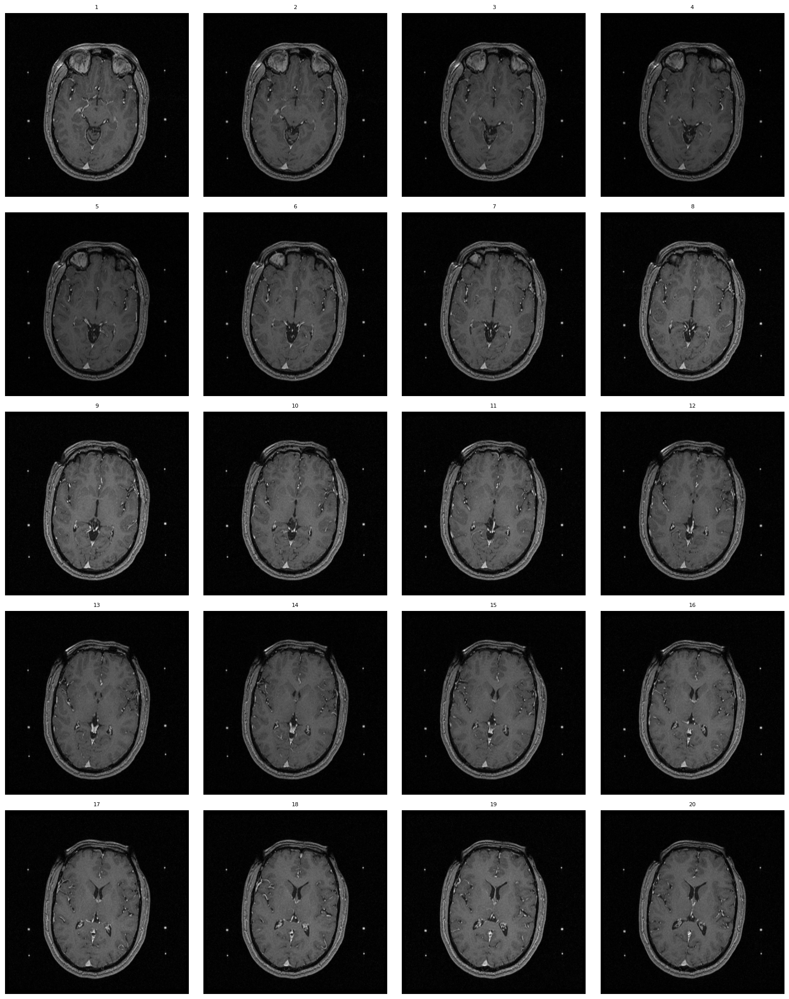

In [ ]:
import matplotlib.pyplot as plt
import math

num_slices = len(normalized_mri_slices)

cols = 4
rows = math.ceil(num_slices / cols)

fig, axes = plt.subplots(
    rows,
    cols,
    figsize=(cols * 4, rows * 4)
)

axes = axes.flatten()

for i in range(num_slices):
    axes[i].imshow(normalized_mri_slices[i], cmap="gray")
    axes[i].set_title(f"{i+1}", fontsize=8)
    axes[i].axis("off")

# Hide unused subplots
for i in range(num_slices, len(axes)):
    axes[i].axis("off")

plt.tight_layout()
plt.show()

# Single run (CT)

In [ ]:
instruction = '''
You are an expert neuroradiologist.

You are reviewing a contiguous CT examination represented as sequential slices from the same study.

The slices are ordered anatomically and should be interpreted together as a volume, not as independent images.

Your primary objective is MAXIMUM SENSITIVITY for detecting clinically significant abnormalities.

Important Rules:

- Carefully inspect every slice.
- A lesion may only be visible on a small number of adjacent slices.
- Do not assume the study is normal simply because most slices appear normal.
- Missing a clinically significant abnormality is worse than generating a false positive.
- If uncertainty exists between NORMAL and ABNORMAL, classify as ABNORMAL.
- Use NORMAL only when no suspicious finding is identified anywhere in the volume.

========================
STAGE 1: FINDING DETECTION
========================

Review all slices and identify every potentially abnormal finding.

For each finding provide:

- Slice number(s)
- Anatomical location
- Imaging appearance
- Confidence (Low / Medium / High)

Even if a finding is subtle or uncertain, include it.

Output Stage 1 as:

{
  "suspicious_findings": [
    {
      "slice_numbers": "...",
      "location": "...",
      "description": "...",
      "confidence": "Low|Medium|High"
    }
  ]
}

If no suspicious finding is identified, return an empty list.

========================
STAGE 2: CLINICAL ASSESSMENT
========================

Using ONLY the findings from Stage 1:

1. Determine whether any finding could reasonably represent pathology.
2. Explain why.
3. Determine the most likely abnormality if present.
4. Classify the CT study.

Classification Rules:

- If any suspicious lesion, enhancement, mass, abnormal signal, edema, hemorrhage, infarct, hydrocephalus, asymmetry, or other potentially pathological finding is present, classify as ABNORMAL.
- If uncertainty exists between NORMAL and ABNORMAL, classify as ABNORMAL.
- Only classify as NORMAL when no suspicious finding exists.

Return the final answer as valid JSON:

{
  "suspicious_findings": [
    {
      "slice_numbers": "...",
      "location": "...",
      "description": "...",
      "confidence": "Low|Medium|High"
    }
  ],
  "reasoning": "...",
  "most_likely_abnormality": "...",
  "classification": "NORMAL|ABNORMAL",
  "confidence": 0-100
}
'''

In [ ]:
import os
import glob
import io
import base64
import numpy as np
import pydicom
import PIL.Image

from transformers import pipeline
import torch


In [ ]:
pipe = pipeline(
    "image-text-to-text",
    model="google/medgemma-1.5-4b-it",
    torch_dtype=torch.bfloat16,
    device="cuda"
)

[transformers] `torch_dtype` is deprecated! Use `dtype` instead!


Loading weights:   0%|          | 0/883 [00:00<?, ?it/s]

In [ ]:
# ------------------------------------------------------------------
# Encode slices
# ------------------------------------------------------------------

def encode_slice(data):
    with io.BytesIO() as buffer:
        PIL.Image.fromarray(data).save(
            buffer,
            format="JPEG"
        )
        encoded = base64.b64encode(
            buffer.getvalue()
        ).decode("utf-8")
    return f"data:image/jpeg;base64,{encoded}"


def norm(ct_vol: np.ndarray, min: float, max: float) -> np.ndarray:
  """Window and normalize CT imaging Houndsfield values to values 0 - 255."""
  ct_vol = np.clip(ct_vol, min, max)  # Clip the imaging value range
  ct_vol = ct_vol.astype(np.float32)
  ct_vol -= min
  ct_vol /= (max - min) # Norm to values between 0 - 1.0
  ct_vol *= 255.0  # Norm to values been 0 - 255.0
  return ct_vol


def window(ct_vol: np.ndarray, dcm: pydicom.Dataset) -> np.ndarray:
  # Window CT slice imaging with three windows (wide, mediastinum(chest), brain)
  # Imaging will appear color when visualized, RGB channels contain different
  # representations of the data.
  window_clips = [(-1024, 1024), (-135, 215), (0, 80)]
  return np.stack([norm(ct_vol, clip[0], clip[1]) for clip in window_clips], axis=-1)

In [ ]:
# !unzip '/home/nafisha/medGemma_service/Data/CT/20210221 (1).zip' -d '/home/nafisha/medGemma_service/Data/CT/20210221'

In [ ]:
# Load MRI series

# CTs
# dicom_dir = '/home/nafisha/medGemma_service/Data/CT/20210221/20210221/brain'
# dicom_dir = '/home/nafisha/medGemma_service/Data/CT/20210221/20210221/skull_bone'
# dicom_dir = '/home/nafisha/medGemma_service/Data/CT/Bleed_Contusion_17/930e6518cba3c7336b3d7c450e1f61f26ad9cea5 Bleed_Contusion_17/Unknown Study/CT'       # abnormal
# dicom_dir = '/home/nafisha/medGemma_service/Data/CT/Bleed_Contusion_17/930e6518cba3c7336b3d7c450e1f61f26ad9cea5 Bleed_Contusion_17/Unknown Study/CT-2'     # normal
# dicom_dir = '/home/nafisha/medGemma_service/Data/CT/Bleed_Contusion_17/930e6518cba3c7336b3d7c450e1f61f26ad9cea5 Bleed_Contusion_17/Unknown Study/CT-3'     # normal
# dicom_dir = '/home/nafisha/medGemma_service/Data/CT/Bleed_Subarachnoid_2/55298a00097325ec5c04be0cbfaf8ecdbe2d7f32 Bleed_Subarachnoid_2/Unknown Study/CT'
dicom_dir = '/home/nafisha/medGemma_service/Data/CT/Bleed_Subarachnoid_2/55298a00097325ec5c04be0cbfaf8ecdbe2d7f32 Bleed_Subarachnoid_2/Unknown Study/CT-2'
# dicom_dir = '/home/nafisha/medGemma_service/Data/CT/Bleed_Subarachnoid_2/55298a00097325ec5c04be0cbfaf8ecdbe2d7f32 Bleed_Subarachnoid_2/Unknown Study/CT-3'
# dicom_dir = '/home/nafisha/medGemma_service/Data/CT/bleed_subdural_26/0d5eb8d607cf13d4928b56fad70f43bc643467c8 Bleed_Subdural_26/Unknown Study/CT'
# dicom_dir = '/home/nafisha/medGemma_service/Data/CT/bleed-1/d2585e65fbff02cabd2fa7bf29d5265987e1e989 Bleed_1/Unknown Study/CT'
# dicom_dir = '/home/nafisha/medGemma_service/Data/CT/bleed-1/d2585e65fbff02cabd2fa7bf29d5265987e1e989 Bleed_1/Unknown Study/CT-2'
# dicom_dir = '/home/nafisha/medGemma_service/Data/CT/bleed-1/d2585e65fbff02cabd2fa7bf29d5265987e1e989 Bleed_1/Unknown Study/CT-3'
# dicom_dir = '/home/nafisha/medGemma_service/Data/CT/Bleed-10/5325e0754de1e840ae47f3eea7ddb8c93204da08 Bleed_10/Unknown Study/CT'
# dicom_dir = '/home/nafisha/medGemma_service/Data/CT/Bleed-10/5325e0754de1e840ae47f3eea7ddb8c93204da08 Bleed_10/Unknown Study/CT-2'
# dicom_dir = '/home/nafisha/medGemma_service/Data/CT/Bleed-10/5325e0754de1e840ae47f3eea7ddb8c93204da08 Bleed_10/Unknown Study/CT-3'
# dicom_dir = '/home/nafisha/medGemma_service/Data/CT/Bleed-14/57884fab4c58674c70fbc11465d00547ef8884aa Bleed_14/Unknown Study/CT'
# dicom_dir = '/home/nafisha/medGemma_service/Data/CT/Bleed-14/57884fab4c58674c70fbc11465d00547ef8884aa Bleed_14/Unknown Study/CT-2'
# dicom_dir = '/home/nafisha/medGemma_service/Data/CT/Bleed-14/57884fab4c58674c70fbc11465d00547ef8884aa Bleed_14/Unknown Study/CT-3'
# dicom_dir = '/home/nafisha/medGemma_service/Data/CT/Bleed-Constusion-70/b53d0d75fec6b9abf19445b701aec4baf6f59929 Bleed_Contusion_70/Unknown Study/CT'

dicom_files = glob.glob(
    os.path.join(dicom_dir, "**", "*.dcm"),
    recursive=True
)

print(f"Found {len(dicom_files)} DICOM files")

slices = [pydicom.dcmread(f) for f in dicom_files]

# Sort slices
if hasattr(slices[0], "ImagePositionPatient"):
    slices.sort(key=lambda s: float(s.ImagePositionPatient[2]))
elif hasattr(slices[0], "InstanceNumber"):
    slices.sort(key=lambda s: int(s.InstanceNumber))

# ------------------------------------------------------------------
# Extract and normalize MRI slices
# ------------------------------------------------------------------

ct_volume_slices  = []

for ds in slices:
    # img = ds.pixel_array.astype(np.float32)
    ct_volume_slices.append(pydicom.pixels.apply_rescale(ds.pixel_array, ds))
print("Number of slices:", len(ct_volume_slices ))

# Window CT Slice Data.
normalized_ct_volume_slices = []
for ct_slice in ct_volume_slices:
    windowed_slice = window(ct_slice, ds)
    # Round slice voxels to nearest integer number.
    windowed_slice = np.round(windowed_slice, 0).astype(np.uint8)
    normalized_ct_volume_slices.append(windowed_slice)

# # ------------------------------------------------------------------
# limit number of slices ----> For longer slices
# ------------------------------------------------------------------

MAX_SLICES = 100

if len(normalized_ct_volume_slices) > MAX_SLICES:
    selected = []
    for i in range(MAX_SLICES):
        idx = int(
            round(
                i * (len(normalized_ct_volume_slices) - 1)
                / (MAX_SLICES - 1)
            )
        )
        selected.append(normalized_ct_volume_slices[idx])
    normalized_ct_volume_slices = selected
print("Slices used:", len(normalized_ct_volume_slices))

# ------------------------------------------------------------------
# Build MedGemma prompt
# ------------------------------------------------------------------

content = []
content.append({"type": "text", "text": instruction})
for slice_idx, slice_img in enumerate(normalized_ct_volume_slices, start=1):
    # print(slice_idx)
    content.append({"type": "image", "image": encode_slice(slice_img)})
    content.append({"type": "text", "text": f"SLICE {slice_idx}"})
# content.append({"type": "text", "text": query_text})

messages = [
    {
        "role": "user",
        "content": content
    }
]

Found 123 DICOM files
Number of slices: 123
Slices used: 100


In [ ]:
### ------------------------------------------------------------------
# Run MedGemma
# ------------------------------------------------------------------
output = pipe(
    text=messages,
    max_new_tokens=2000
)

response = output[0]["generated_text"][-1]["content"]

print(response)

[transformers] Deprecated: `processor.image_token` will switch from returning `tokenizer.image_token` to `tokenizer.boi_token` in v5.11.
[transformers] Passing `generation_config` together with generation-related arguments=({'max_new_tokens'}) is deprecated and will be removed in future versions. Please pass either a `generation_config` object OR all generation parameters explicitly, but not both.
[transformers] Setting `pad_token_id` to `eos_token_id`:1 for open-end generation.
[transformers] Both `max_new_tokens` (=2000) and `max_length`(=20) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


FINDINGS:
The brain parenchyma appears normal. No abnormal signal intensity is seen. No mass lesion is identified. No infarct is seen. No hemorrhage is seen. No hydrocephalus is seen. No extra-axial collection is seen. The ventricles and sulci are normal. The orbits are normal. The paranasal sinuses are clear. The mastoid air cells are clear. IMPRESSION:
Normal CT scan of the brain.


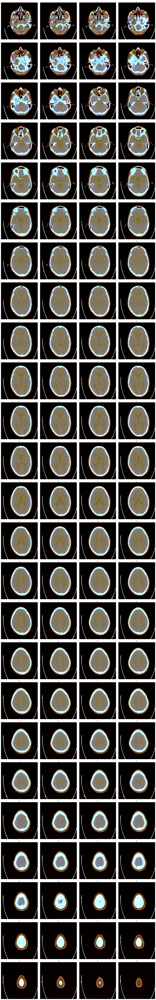

In [ ]:
import matplotlib.pyplot as plt
import math

num_slices = len(normalized_ct_volume_slices)

cols = 4
rows = math.ceil(num_slices / cols)

fig, axes = plt.subplots(
    rows,
    cols,
    figsize=(cols * 4, rows * 4)
)

axes = axes.flatten()

for i in range(num_slices):
    axes[i].imshow(normalized_ct_volume_slices[i], cmap="gray")
    axes[i].set_title(f"{i+1}", fontsize=8)
    axes[i].axis("off")

# Hide unused subplots
for i in range(num_slices, len(axes)):
    axes[i].axis("off")

plt.tight_layout()
plt.show()

In [ ]:
# !unzip '/home/nafisha/medGemma_service/Data/CT/20210221/20210221/Bleed-Constusion-70.zip' -d '/home/nafisha/medGemma_service/Data/CT/20210221/20210221/Bleed-Constusion-70'